In [188]:
from pandas import to_numeric
from pandas import melt
from pandas import read_csv
from pandas import DataFrame
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import string as st

In [189]:
df = read_csv("pd_speech_features.csv")

In [190]:
df.head()

,Unnamed: 0,Unnamed: 1,Baseline Features,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 745,Unnamed: 746,Unnamed: 747,Unnamed: 748,Unnamed: 749,Unnamed: 750,Unnamed: 751,Unnamed: 752,Unnamed: 753,Unnamed: 754
0,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
1,0,1,0.85247,0.71826,0.57227,240,239,0.00806353,8.68E-05,0.00218,...,1.562,2.6445,3.8686,4.2105,5.1221,4.4625,2.6202,3.0004,18.9405,1
2,0,1,0.76686,0.69481,0.53966,234,233,0.008258256,7.31E-05,0.00195,...,1.5589,3.6107,23.5155,14.1962,11.0261,9.5082,6.5245,6.3431,45.178,1
3,0,1,0.85083,0.67604,0.58982,232,231,0.00833959,6.04E-05,0.00176,...,1.5643,2.3308,9.4959,10.7458,11.0177,4.8066,2.9199,3.1495,4.7666,1
4,1,0,0.41121,0.79672,0.59257,178,177,0.010857733,0.000182739,0.00419,...,3.7805,3.5664,5.2558,14.0403,4.2235,4.6857,4.846,6.265,4.0603,1


In [191]:
df.columns = df.iloc[0]
df = df[1:]

In [192]:
df.head()

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
1,0,1,0.85247,0.71826,0.57227,240,239,0.00806353,8.68E-05,0.00218,...,1.562,2.6445,3.8686,4.2105,5.1221,4.4625,2.6202,3.0004,18.9405,1
2,0,1,0.76686,0.69481,0.53966,234,233,0.008258256,7.31E-05,0.00195,...,1.5589,3.6107,23.5155,14.1962,11.0261,9.5082,6.5245,6.3431,45.178,1
3,0,1,0.85083,0.67604,0.58982,232,231,0.00833959,6.04E-05,0.00176,...,1.5643,2.3308,9.4959,10.7458,11.0177,4.8066,2.9199,3.1495,4.7666,1
4,1,0,0.41121,0.79672,0.59257,178,177,0.010857733,0.000182739,0.00419,...,3.7805,3.5664,5.2558,14.0403,4.2235,4.6857,4.846,6.265,4.0603,1
5,1,0,0.3279,0.79782,0.53028,236,235,0.008161574,0.002668863,0.00535,...,6.1727,5.8416,6.0805,5.7621,7.7817,11.6891,8.2103,5.0559,6.1164,1


In [222]:
columns = list(df.columns)
df[columns] = df[columns].apply(to_numeric)
print(df.dtypes)

0
id                             int64
gender                         int64
PPE                          float64
DFA                          float64
RPDE                         float64
                              ...   
tqwt_kurtosisValue_dec_33    float64
tqwt_kurtosisValue_dec_34    float64
tqwt_kurtosisValue_dec_35    float64
tqwt_kurtosisValue_dec_36    float64
class                          int64
Length: 755, dtype: object


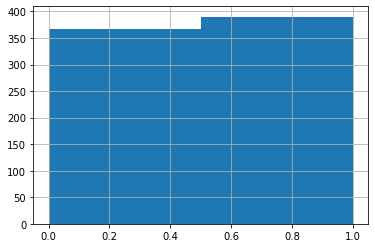

In [223]:
hist_plot = df['gender'].hist(bins=2)

In [160]:
df['gender'].nunique()

2

##### There are 754 attributes/features and 756 objects in the dataset. The last feature "Class" is the target variable. Gender feature has binary data( '1' = Male, '0' = Female ). Rest of the features have numerical value (type = int or float)

# Finding mean median mode std,etc of FEATURES

In [161]:
l= [['column_name','mean','std','median','range','first_quantile','third_quantile']]
for att in columns:
    arr = np.array(df[att].astype(float))
    mean = np.mean(arr)
    std = np.std(arr)
    median = np.median(arr)
    ra = max(arr) - min(arr)
    Q1 = np.quantile(arr,.25)
    Q3 = np.quantile(arr,.75)
    l.append([att,mean,std,median,ra,Q1,Q3])
    
df_ct = DataFrame(l)
df_ct.columns = df_ct.iloc[0]
df_ct = df_ct[1:]

In [162]:
df_ct

,column_name,mean,std,median,range,first_quantile,third_quantile
1,id,125.5,72.745561,125.5,251.0,62.75,188.25
2,gender,0.515873,0.499748,1.0,1.0,0.0,1.0
3,PPE,0.746284,0.169182,0.809655,0.866109,0.762833,0.834315
4,DFA,0.700414,0.069672,0.700525,0.30914,0.647053,0.754985
5,RPDE,0.489058,0.137352,0.484355,0.71693,0.386537,0.586515
...,...,...,...,...,...,...,...
751,tqwt_kurtosisValue_dec_33,12.375335,16.330854,4.74145,71.9035,3.114375,12.201325
752,tqwt_kurtosisValue_dec_34,14.79923,15.7121,6.7257,60.1456,3.665925,21.92205
753,tqwt_kurtosisValue_dec_35,14.751559,14.42343,7.33425,55.5884,3.741275,22.495175
754,tqwt_kurtosisValue_dec_36,31.48111,34.208344,10.63725,154.0597,3.94875,61.125325


# The distribution of the FEATURES

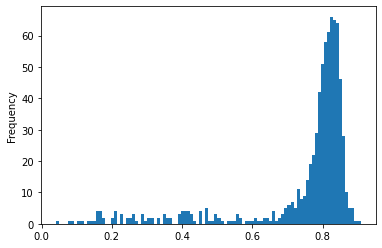

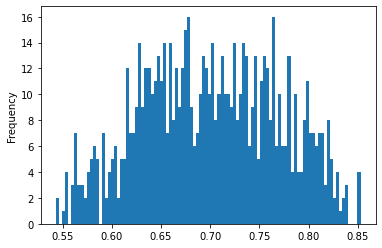

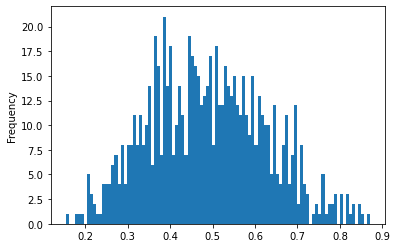

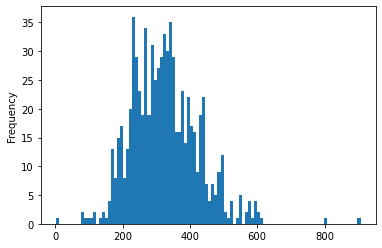

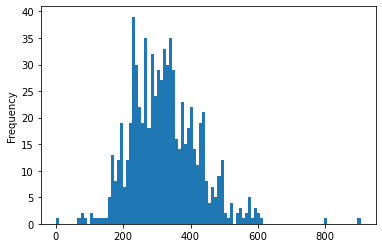

...

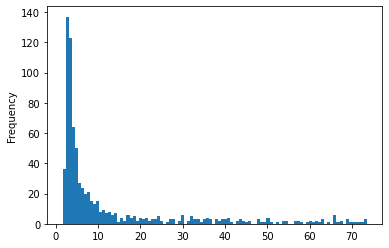

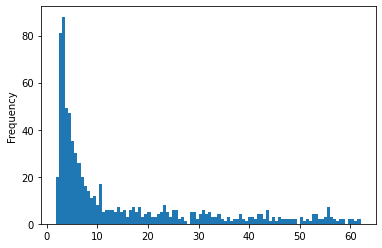

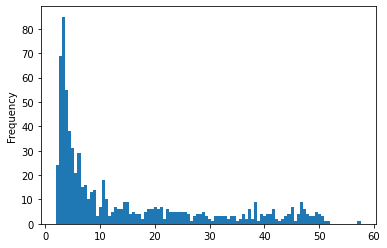

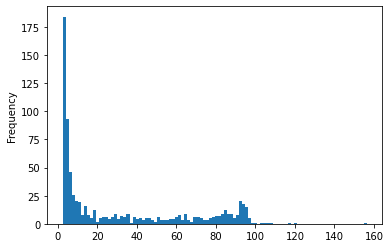

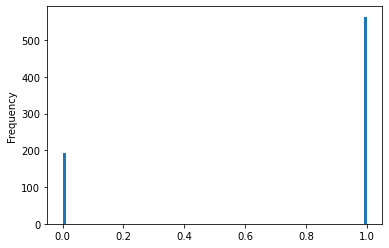

In [138]:
for val in columns[2:len(columns)]:
    df[val].plot(xlabel = val,kind = 'hist',bins = 100)
    plt.show()

#### Maximum attributes have values sampled from gaussian/skewed gaussian

# CORELLATION OF THE FEATURES

In [163]:
cor = df.corr()
print(cor)

0                                id    gender       PPE       DFA      RPDE  \
0                                                                             
id                         1.000000 -0.133605  0.026667  0.041938 -0.084606   
gender                    -0.133605  1.000000  0.010175  0.099356  0.168321   
PPE                        0.026667  0.010175  1.000000 -0.094775 -0.405558   
DFA                        0.041938  0.099356 -0.094775  1.000000  0.155075   
RPDE                      -0.084606  0.168321 -0.405558  0.155075  1.000000   
...                             ...       ...       ...       ...       ...   
tqwt_kurtosisValue_dec_33 -0.053781  0.107618  0.045755 -0.033914 -0.097161   
tqwt_kurtosisValue_dec_34 -0.058034  0.128936  0.046175  0.043454 -0.036406   
tqwt_kurtosisValue_dec_35 -0.057807  0.107734  0.037385  0.067843 -0.018052   
tqwt_kurtosisValue_dec_36 -0.055775  0.104828  0.039588  0.116699  0.021945   
class                     -0.111661  0.182713 -0.072

In [164]:
df3 = DataFrame(cor)

In [151]:
df3.head()

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
0,,,,,,,,,,,,,,,,,,,,,
id,1.000000,-0.133605,0.026667,0.041938,-0.084606,0.085828,0.085226,-0.100831,-0.060464,-0.052865,...,0.036897,0.016047,-0.023317,-0.045943,-0.041835,-0.053781,-0.058034,-0.057807,-0.055775,-0.111661
gender,-0.133605,1.000000,0.010175,0.099356,0.168321,-0.478367,-0.477710,0.460422,-0.110587,0.112004,...,-0.098689,0.000210,0.066091,0.083499,0.089793,0.107618,0.128936,0.107734,0.104828,0.182713
PPE,0.026667,0.010175,1.000000,-0.094775,-0.405558,0.191535,0.194098,-0.201907,-0.423660,-0.349053,...,0.144261,0.135544,0.091726,0.065035,0.044163,0.045755,0.046175,0.037385,0.039588,-0.072939
DFA,0.041938,0.099356,-0.094775,1.000000,0.155075,-0.286791,-0.286611,0.253708,0.084655,0.212120,...,-0.146325,-0.104456,-0.061129,-0.063451,-0.061845,-0.033914,0.043454,0.067843,0.116699,0.306070
RPDE,-0.084606,0.168321,-0.405558,0.155075,1.000000,-0.521193,-0.524839,0.506707,0.333545,0.614340,...,-0.315592,-0.278504,-0.148989,-0.101467,-0.098923,-0.097161,-0.036406,-0.018052,0.021945,0.247444


In [152]:
df3.to_csv('attribute_correlation.csv',index = True)

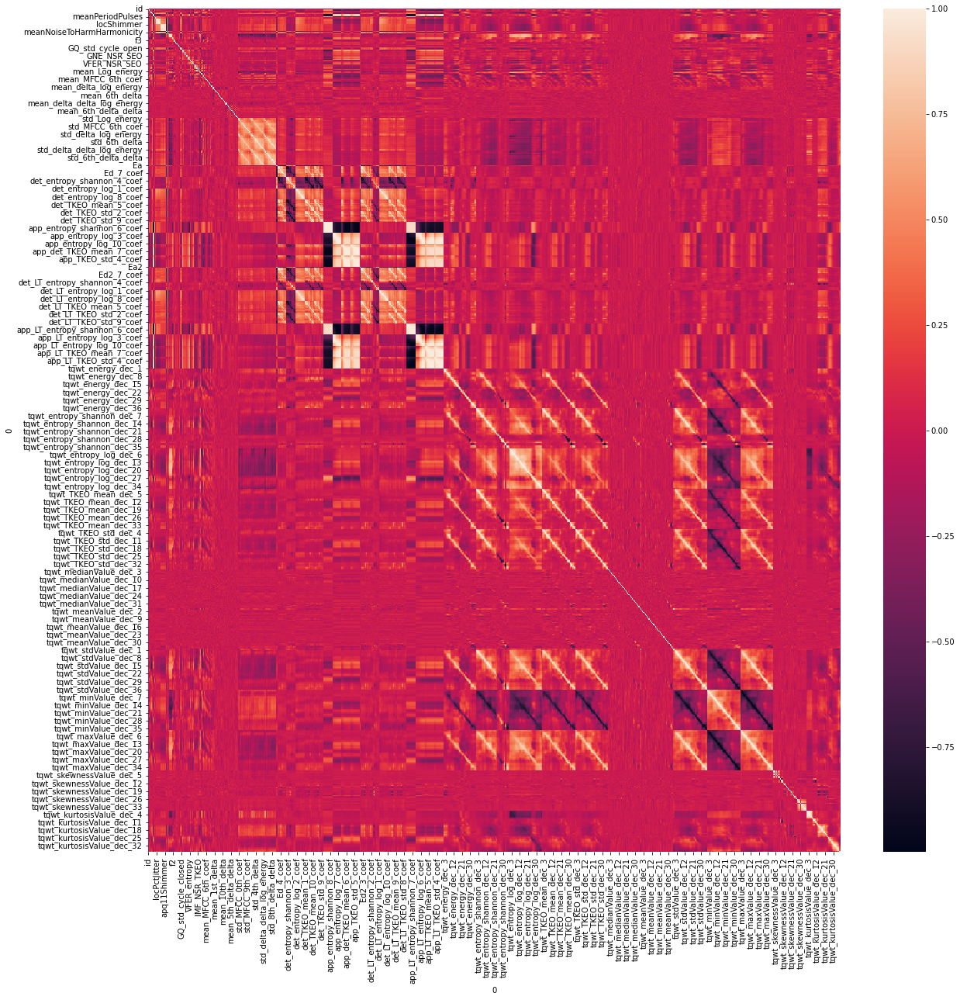

In [166]:
plt.figure(figsize = (20,20))
sns.heatmap(data = cor)
plt.show()

#### Above csv has the correlation between all attributes

# DATA CLEANING PROCESS

In [167]:
df = read_csv("pd_speech_features.csv")
df.columns = df.iloc[0]
df = df[1:]

In [168]:
df.head()

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
1,0,1,0.85247,0.71826,0.57227,240,239,0.00806353,8.68E-05,0.00218,...,1.562,2.6445,3.8686,4.2105,5.1221,4.4625,2.6202,3.0004,18.9405,1
2,0,1,0.76686,0.69481,0.53966,234,233,0.008258256,7.31E-05,0.00195,...,1.5589,3.6107,23.5155,14.1962,11.0261,9.5082,6.5245,6.3431,45.178,1
3,0,1,0.85083,0.67604,0.58982,232,231,0.00833959,6.04E-05,0.00176,...,1.5643,2.3308,9.4959,10.7458,11.0177,4.8066,2.9199,3.1495,4.7666,1
4,1,0,0.41121,0.79672,0.59257,178,177,0.010857733,0.000182739,0.00419,...,3.7805,3.5664,5.2558,14.0403,4.2235,4.6857,4.846,6.265,4.0603,1
5,1,0,0.3279,0.79782,0.53028,236,235,0.008161574,0.002668863,0.00535,...,6.1727,5.8416,6.0805,5.7621,7.7817,11.6891,8.2103,5.0559,6.1164,1


In [194]:
null_values = df[df.isna().any(axis=1)]

In [195]:
null_values

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class


#### No Null Values

In [197]:
var = 0
l = list()
for value in columns:
    arr = list(df[value])
    for i in range(len(arr)):
        if str(arr[i]) in st.punctuation:
                list.append([i,var])
        else:
            pass
    var+=1
    
if len(l) == 0:
    print("No missing values")
else:
    print(l)

No missing values


#### No Missing Values

In [198]:
counts = df.nunique()
columns = [(i,v/df.shape[0]*100) for i,v in enumerate(counts) if v/df.shape[0]*100<10]
print(columns)

[(1, 0.26455026455026454), (754, 0.26455026455026454)]


In [199]:
0 in df.values

True

In [205]:
(df == 0).astype(int).sum()
    

0
id                             3
gender                       366
PPE                            0
DFA                            0
RPDE                           0
                            ... 
tqwt_kurtosisValue_dec_33      0
tqwt_kurtosisValue_dec_34      0
tqwt_kurtosisValue_dec_35      0
tqwt_kurtosisValue_dec_36      0
class                        192
Length: 755, dtype: int64

# Dropping columns with low variance

In [211]:
df.std()<1.0

0
id                           False
gender                        True
PPE                           True
DFA                           True
RPDE                          True
                             ...  
tqwt_kurtosisValue_dec_33    False
tqwt_kurtosisValue_dec_34    False
tqwt_kurtosisValue_dec_35    False
tqwt_kurtosisValue_dec_36    False
class                         True
Length: 755, dtype: bool

In [225]:
columns = df.columns.tolist()
print(columns)

['id', 'gender', 'PPE', 'DFA', 'RPDE', 'numPulses', 'numPeriodsPulses', 'meanPeriodPulses', 'stdDevPeriodPulses', 'locPctJitter', 'locAbsJitter', 'rapJitter', 'ppq5Jitter', 'ddpJitter', 'locShimmer', 'locDbShimmer', 'apq3Shimmer', 'apq5Shimmer', 'apq11Shimmer', 'ddaShimmer', 'meanAutoCorrHarmonicity', 'meanNoiseToHarmHarmonicity', 'meanHarmToNoiseHarmonicity', 'minIntensity', 'maxIntensity', 'meanIntensity', 'f1', 'f2', 'f3', 'f4', 'b1', 'b2', 'b3', 'b4', 'GQ_prc5_95', 'GQ_std_cycle_open', 'GQ_std_cycle_closed', 'GNE_mean', 'GNE_std', 'GNE_SNR_TKEO', 'GNE_SNR_SEO', 'GNE_NSR_TKEO', 'GNE_NSR_SEO', 'VFER_mean', 'VFER_std', 'VFER_entropy', 'VFER_SNR_TKEO', 'VFER_SNR_SEO', 'VFER_NSR_TKEO', 'VFER_NSR_SEO', 'IMF_SNR_SEO', 'IMF_SNR_TKEO', 'IMF_SNR_entropy', 'IMF_NSR_SEO', 'IMF_NSR_TKEO', 'IMF_NSR_entropy', 'mean_Log_energy', 'mean_MFCC_0th_coef', 'mean_MFCC_1st_coef', 'mean_MFCC_2nd_coef', 'mean_MFCC_3rd_coef', 'mean_MFCC_4th_coef', 'mean_MFCC_5th_coef', 'mean_MFCC_6th_coef', 'mean_MFCC_7th_co

In [227]:
for val in columns:
    if float(df[val].std())<1.0:
        df.drop(val,axis = 1,inplace = True)
        print(df.shape)
    else:
        pass

(756, 754)
(756, 753)
(756, 752)
(756, 751)
(756, 750)
(756, 749)
(756, 748)
(756, 747)
(756, 746)
(756, 745)
(756, 744)
(756, 743)
(756, 742)
(756, 741)
(756, 740)
(756, 739)
(756, 738)
(756, 737)
(756, 736)
(756, 735)
(756, 734)
(756, 733)
(756, 732)
(756, 731)
(756, 730)
(756, 729)
(756, 728)
(756, 727)
(756, 726)
(756, 725)
(756, 724)
(756, 723)
(756, 722)
(756, 721)
(756, 720)
(756, 719)
(756, 718)
(756, 717)
(756, 716)
(756, 715)
(756, 714)
(756, 713)
(756, 712)
(756, 711)
(756, 710)
(756, 709)
(756, 708)
(756, 707)
(756, 706)
(756, 705)
(756, 704)
(756, 703)
(756, 702)
(756, 701)
(756, 700)
(756, 699)
(756, 698)
(756, 697)
(756, 696)
(756, 695)
(756, 694)
(756, 693)
(756, 692)
(756, 691)
(756, 690)
(756, 689)
(756, 688)
(756, 687)
(756, 686)
(756, 685)
(756, 684)
(756, 683)
(756, 682)
(756, 681)
(756, 680)
(756, 679)
(756, 678)
(756, 677)
(756, 676)
(756, 675)
(756, 674)
(756, 673)
(756, 672)
(756, 671)
(756, 670)
(756, 669)
(756, 668)
(756, 667)
(756, 666)
(756, 665)
(756, 664)

In [228]:
df.shape

(756, 290)

In [229]:
df.describe()

,id,numPulses,numPeriodsPulses,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,...,tqwt_kurtosisValue_dec_27,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36
count,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,...,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000
mean,125.500000,323.972222,322.678571,18.859632,70.828609,76.135371,73.997008,647.174519,1233.852088,2562.425251,...,21.026054,26.237251,22.840337,18.587888,13.872018,12.218953,12.375335,14.799230,14.751559,31.481110
std,72.793721,99.219059,99.402499,5.576473,8.858268,6.446451,7.018006,134.957916,169.090402,393.315598,...,43.716898,42.220693,32.626464,25.537464,20.046029,17.783642,16.341665,15.722502,14.432979,34.230991
min,0.000000,2.000000,1.000000,1.655000,28.651529,44.133492,39.984109,237.149533,761.357661,1411.231297,...,1.342700,1.509800,1.531700,1.582900,1.747200,1.789500,1.628700,1.861700,1.955900,2.364000
25%,62.750000,251.000000,250.000000,15.713250,67.248014,73.322769,70.920615,562.879119,1117.316190,2380.426103,...,1.814850,2.408675,3.452800,3.354825,3.077450,2.937025,3.114375,3.665925,3.741275,3.948750
50%,125.500000,317.000000,316.000000,19.309500,74.121030,78.581351,76.855313,641.181498,1215.344125,2612.204198,...,3.075050,5.586300,7.062750,6.077400,4.770850,4.300450,4.741450,6.725700,7.334250,10.637250
75%,188.250000,384.250000,383.250000,22.877750,76.850515,80.402498,78.718785,737.222678,1339.826741,2831.959198,...,12.129975,28.958075,29.830850,21.944050,13.188000,10.876150,12.201325,21.922050,22.495175,61.125325
max,251.000000,907.000000,905.000000,33.197000,83.908349,86.316176,85.096353,1015.524047,1922.747225,3475.648017,...,355.516100,239.788800,203.311300,121.542900,102.207000,85.571700,73.532200,62.007300,57.544300,156.423700


In [236]:
l = [i for i in df.duplicated() if i == True]
print(l)

[True]


In [238]:
df.drop_duplicates(inplace = True)

In [239]:
df.shape

(755, 290)

In [241]:
new_corr = df.corr()

In [242]:
new_corr

,id,numPulses,numPeriodsPulses,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,...,tqwt_kurtosisValue_dec_27,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36
0,,,,,,,,,,,,,,,,,,,,,
id,1.000000,0.085864,0.085266,0.005405,0.003027,-0.038780,-0.025906,0.021719,0.184373,-0.025221,...,0.052420,0.036074,0.015135,-0.024334,-0.046804,-0.042600,-0.054707,-0.059305,-0.059115,-0.056854
numPulses,0.085864,1.000000,0.999917,0.345670,0.143428,0.113214,0.126858,0.391337,0.299473,-0.191369,...,0.405135,0.268927,0.177272,0.043949,-0.024247,-0.036181,-0.047976,-0.068719,-0.069702,-0.062967
numPeriodsPulses,0.085266,0.999917,1.000000,0.350398,0.145624,0.114379,0.128454,0.390967,0.298742,-0.190957,...,0.405251,0.269572,0.177694,0.044239,-0.023956,-0.035975,-0.047866,-0.068613,-0.069521,-0.062829
meanHarmToNoiseHarmonicity,0.005405,0.345670,0.350398,1.000000,0.432999,0.365575,0.407941,0.101812,-0.056241,-0.181745,...,0.310917,0.321200,0.303263,0.244341,0.223184,0.210451,0.193080,0.113668,0.082512,0.036969
minIntensity,0.003027,0.143428,0.145624,0.432999,1.000000,0.872128,0.911896,0.228024,0.082580,0.147534,...,0.194897,0.274982,0.252765,0.156808,0.133096,0.117748,0.100203,-0.048700,-0.141049,-0.321265
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tqwt_kurtosisValue_dec_32,-0.042600,-0.036181,-0.035975,0.210451,0.117748,0.149783,0.154729,-0.022737,-0.001665,-0.009079,...,0.142941,0.283522,0.525746,0.768003,0.927835,1.000000,0.945095,0.729424,0.609527,0.467757
tqwt_kurtosisValue_dec_33,-0.054707,-0.047976,-0.047866,0.193080,0.100203,0.131154,0.135194,-0.044040,-0.046375,-0.002042,...,0.083902,0.238914,0.486360,0.708522,0.841309,0.945095,1.000000,0.824551,0.698599,0.543646
tqwt_kurtosisValue_dec_34,-0.059305,-0.068719,-0.068613,0.113668,-0.048700,-0.027353,-0.031670,-0.112709,-0.122348,-0.038595,...,0.016844,0.139219,0.382986,0.587207,0.667187,0.729424,0.824551,1.000000,0.947970,0.785016


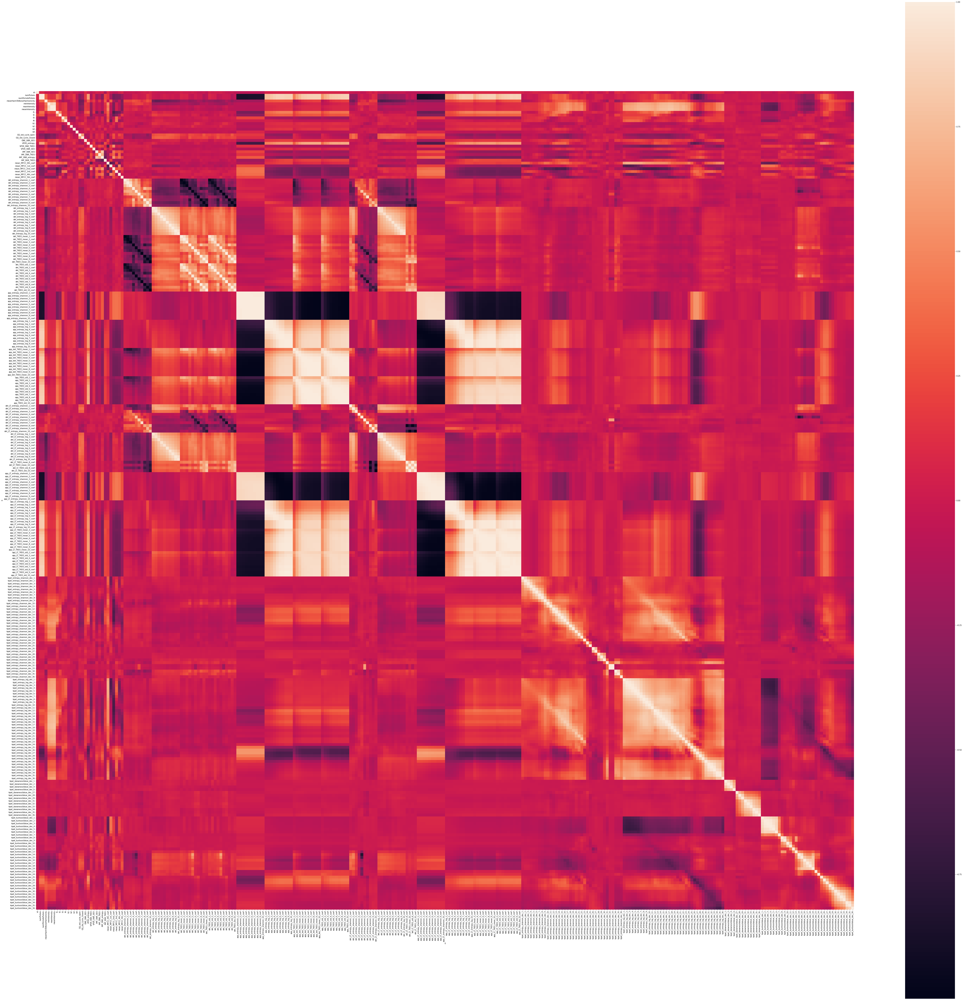

In [249]:
plt.figure(figsize = (100,100))
sns.heatmap(data = new_corr, square = True)
plt.show()

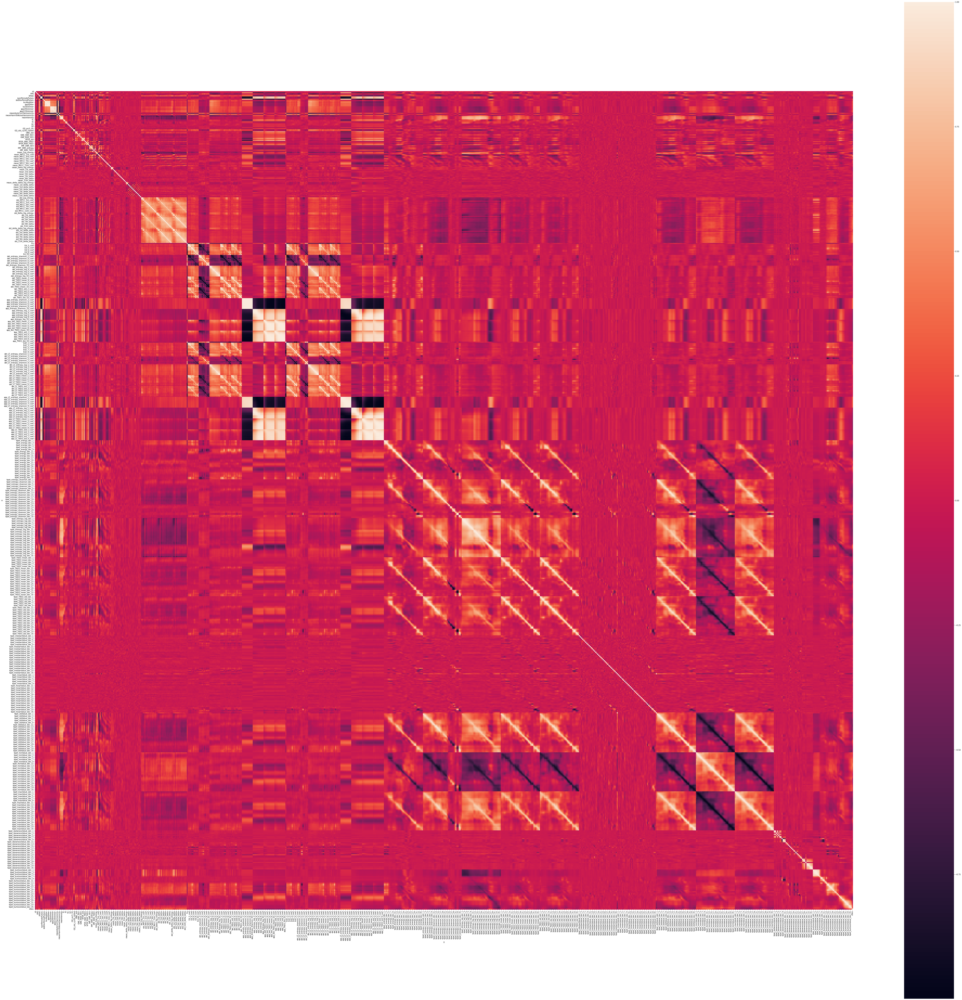

In [250]:
plt.figure(figsize = (100,100))
sns.heatmap(data = cor, square = True)
plt.show()